In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/data.yaml
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3504.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3926.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3721.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3851.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3749.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3975.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3223.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3577.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3615.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3931.txt


In [2]:
# Download MT-YOLOv6 repository and install requirements
!git clone https://github.com/meituan/YOLOv6
%cd YOLOv6
!pip install -r requirements.txt

!pip uninstall -y wandb

Cloning into 'YOLOv6'...
remote: Enumerating objects: 3838, done.
remote: Total 3838 (delta 0), reused 0 (delta 0), pack-reused 3838 (from 1)
Receiving objects: 100% (3838/3838), 43.99 MiB | 43.14 MiB/s, done.
Resolving deltas: 100% (2297/2297), done.
/kaggle/working/YOLOv6
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 38.1 MB/s eta 0:00:00
Found existing installation: wandb 0.19.1
Uninstalling wandb-0.19.1:
  Successfully uninstalled wandb-0.19.1


In [3]:
%%writefile /kaggle/working/YOLOv6/yolov6/data/datasets.py

#!/usr/bin/env python3
# -*- coding:utf-8 -*-

import cv2
change_colorspace = cv2.COLOR_BGR2XYZ
change_colorspace2 = cv2.COLOR_RGB2XYZ

import glob
from io import UnsupportedOperation
import os
import os.path as osp
import random
import json
import time
import hashlib
from pathlib import Path

from multiprocessing.pool import Pool

import cv2
import numpy as np
from tqdm import tqdm
from PIL import ExifTags, Image, ImageOps

import torch
from torch.utils.data import Dataset
import torch.distributed as dist

from .data_augment import (
    augment_hsv,
    letterbox,
    mixup,
    random_affine,
    mosaic_augmentation,
)
from yolov6.utils.events import LOGGER
import copy
import psutil
from multiprocessing.pool import ThreadPool


# Parameters
IMG_FORMATS = ["bmp", "jpg", "jpeg", "png", "tif", "tiff", "dng", "webp", "mpo"]
VID_FORMATS = ["mp4", "mov", "avi", "mkv"]
IMG_FORMATS.extend([f.upper() for f in IMG_FORMATS])
VID_FORMATS.extend([f.upper() for f in VID_FORMATS])
# Get orientation exif tag
for k, v in ExifTags.TAGS.items():
    if v == "Orientation":
        ORIENTATION = k
        break

def img2label_paths(img_paths):
    # Define label paths as a function of image paths
    sa, sb = f'{os.sep}images{os.sep}', f'{os.sep}labels{os.sep}'  # /images/, /labels/ substrings
    return [sb.join(x.rsplit(sa, 1)).rsplit('.', 1)[0] + '.txt' for x in img_paths]

class TrainValDataset(Dataset):
    '''YOLOv6 train_loader/val_loader, loads images and labels for training and validation.'''
    def __init__(
        self,
        img_dir,
        img_size=640,
        batch_size=16,
        augment=False,
        hyp=None,
        rect=False,
        check_images=False,
        check_labels=False,
        stride=32,
        pad=0.0,
        rank=-1,
        data_dict=None,
        task="train",
        specific_shape = False,
        height=1088,
        width=1920,
        cache_ram=False
    ):
        assert task.lower() in ("train", "val", "test", "speed"), f"Not supported task: {task}"
        tik = time.time()
        self.__dict__.update(locals())
        self.main_process = self.rank in (-1, 0)
        self.task = self.task.capitalize()
        self.class_names = data_dict["names"]
        self.img_paths, self.labels = self.get_imgs_labels(self.img_dir)
        self.rect = rect
        self.specific_shape = specific_shape
        self.target_height = height
        self.target_width = width
        self.cache_ram = cache_ram

        if self.rect:
            shapes = [self.img_info[p]["shape"] for p in self.img_paths]
            self.shapes = np.array(shapes, dtype=np.float64)
            if dist.is_initialized():
                # in DDP mode, we need to make sure all images within batch_size * gpu_num
                # will resized and padded to same shape.
                sample_batch_size = self.batch_size * dist.get_world_size()
            else:
                sample_batch_size = self.batch_size
            self.batch_indices = np.floor(
                np.arange(len(shapes)) / sample_batch_size
            ).astype(
                np.int_
            )  # batch indices of each image

            self.sort_files_shapes()
 
        if self.cache_ram:
            self.num_imgs = len(self.img_paths)
            self.imgs, self.imgs_hw0, self.imgs_hw = [None] * self.num_imgs, [None] * self.num_imgs, [None] * self.num_imgs
            self.cache_images(num_imgs=self.num_imgs)

        tok = time.time()

        if self.main_process:
            LOGGER.info(f"%.1fs for dataset initialization." % (tok - tik))
    
    def cache_images(self, num_imgs=None):
        assert num_imgs is not None, "num_imgs must be specified as the size of the dataset"

        mem = psutil.virtual_memory()
        mem_required = self.cal_cache_occupy(num_imgs)
        gb = 1 << 30

        if mem_required > mem.available:
            self.cache_ram = False
            LOGGER.warning("Not enough RAM to cache images, caching is disabled.")
        else:
            LOGGER.warning(
                f"{mem_required / gb:.1f}GB RAM required, "
                f"{mem.available / gb:.1f}/{mem.total / gb:.1f}GB RAM available, "
                f"Since the first thing we do is cache, "
                f"there is no guarantee that the remaining memory space is sufficient"
            )

        print(f"self.imgs: {len(self.imgs)}")
        LOGGER.info("You are using cached images in RAM to accelerate training!")
        LOGGER.info(
            "Caching images...\n"
            "This might take some time for your dataset"
        )
        num_threads = min(16, max(1, os.cpu_count() - 1))
        load_imgs = ThreadPool(num_threads).imap(self.load_image, range(num_imgs))
        pbar = tqdm(enumerate(load_imgs), total=num_imgs, disable=self.rank > 0)
        for i, (x, (h0, w0), shape) in pbar:
            self.imgs[i], self.imgs_hw0[i], self.imgs_hw[i] = x, (h0, w0), shape

    def __del__(self):
        if self.cache_ram:
            del self.imgs
        
    def cal_cache_occupy(self, num_imgs):
        '''estimate the memory required to cache images in RAM.
        '''
        cache_bytes = 0
        num_imgs = len(self.img_paths)
        num_samples = min(num_imgs, 32)
        for _ in range(num_samples):
            img, _, _ = self.load_image(index=random.randint(0, len(self.img_paths) - 1))
            cache_bytes += img.nbytes
        mem_required = cache_bytes * num_imgs / num_samples
        return mem_required

    def __len__(self):
        """Get the length of dataset"""
        return len(self.img_paths)
 
    def __getitem__(self, index):
        """Fetching a data sample for a given key.
        This function applies mosaic and mixup augments during training.
        During validation, letterbox augment is applied.
        """
        target_shape = (
                (self.target_height, self.target_width) if self.specific_shape else
                self.batch_shapes[self.batch_indices[index]] if self.rect
                else self.img_size
                )

        # Mosaic Augmentation
        if self.augment and random.random() < self.hyp["mosaic"]:
            img, labels = self.get_mosaic(index, target_shape)
            shapes = None

            # MixUp augmentation
            if random.random() < self.hyp["mixup"]:
                img_other, labels_other = self.get_mosaic(
                    random.randint(0, len(self.img_paths) - 1), target_shape
                )
                img, labels = mixup(img, labels, img_other, labels_other)

        else:
            # Load image
            if self.hyp and "shrink_size" in self.hyp:
                img, (h0, w0), (h, w) = self.load_image(index, self.hyp["shrink_size"])
            else:
                img, (h0, w0), (h, w) = self.load_image(index)

            # letterbox
            img, ratio, pad = letterbox(img, target_shape, auto=False, scaleup=self.augment)
            shapes = (h0, w0), ((h * ratio / h0, w * ratio / w0), pad)  # for COCO mAP rescaling

            labels = self.labels[index].copy()
            if labels.size:
                w *= ratio
                h *= ratio
                # new boxes
                boxes = np.copy(labels[:, 1:])
                boxes[:, 0] = (
                    w * (labels[:, 1] - labels[:, 3] / 2) + pad[0]
                )  # top left x
                boxes[:, 1] = (
                    h * (labels[:, 2] - labels[:, 4] / 2) + pad[1]
                )  # top left y
                boxes[:, 2] = (
                    w * (labels[:, 1] + labels[:, 3] / 2) + pad[0]
                )  # bottom right x
                boxes[:, 3] = (
                    h * (labels[:, 2] + labels[:, 4] / 2) + pad[1]
                )  # bottom right y
                labels[:, 1:] = boxes

            if self.augment:
                img, labels = random_affine(
                    img,
                    labels,
                    degrees=self.hyp["degrees"],
                    translate=self.hyp["translate"],
                    scale=self.hyp["scale"],
                    shear=self.hyp["shear"],
                    new_shape=target_shape,
                )

        if len(labels):
            h, w = img.shape[:2]

            labels[:, [1, 3]] = labels[:, [1, 3]].clip(0, w - 1e-3)  # x1, x2
            labels[:, [2, 4]] = labels[:, [2, 4]].clip(0, h - 1e-3)  # y1, y2

            boxes = np.copy(labels[:, 1:])
            boxes[:, 0] = ((labels[:, 1] + labels[:, 3]) / 2) / w  # x center
            boxes[:, 1] = ((labels[:, 2] + labels[:, 4]) / 2) / h  # y center
            boxes[:, 2] = (labels[:, 3] - labels[:, 1]) / w  # width
            boxes[:, 3] = (labels[:, 4] - labels[:, 2]) / h  # height
            labels[:, 1:] = boxes

        if self.augment:
            img, labels = self.general_augment(img, labels)

        labels_out = torch.zeros((len(labels), 6))
        if len(labels):
            labels_out[:, 1:] = torch.from_numpy(labels)

        # Convert
        img = img.transpose((2, 0, 1))[::-1]  # HWC to CHW, BGR to RGB
        img = np.ascontiguousarray(img)

        return torch.from_numpy(img), labels_out, self.img_paths[index], shapes
 
    def load_image(self, index, shrink_size=None):
        """Load image.
        This function loads image by cv2, resize original image to target shape(img_size) with keeping ratio.

        Returns:
            Image, original shape of image, resized image shape
        """
        path = self.img_paths[index]
        
        if self.cache_ram and self.imgs[index] is not None:
            im = self.imgs[index]
            # im = copy.deepcopy(im)
            return self.imgs[index], self.imgs_hw0[index], self.imgs_hw[index]
        else:
            try:
                im = cv2.imread(path)
                im = cv2.cvtColor(im, change_colorspace)
                assert im is not None, f"opencv cannot read image correctly or {path} not exists"
            except Exception as e:
                print(e)
                im = cv2.cvtColor(np.asarray(Image.open(path)), change_colorspace2)
                assert im is not None, f"Image Not Found {path}, workdir: {os.getcwd()}"
            h0, w0 = im.shape[:2]  # origin shape
            if self.specific_shape:
                # keep ratio resize
                ratio = min(self.target_width / w0, self.target_height / h0)

            elif shrink_size:
                ratio = (self.img_size - shrink_size) / max(h0, w0)

            else:
                ratio = self.img_size / max(h0, w0)
            if ratio != 1:
                    im = cv2.resize(
                        im,
                        (int(w0 * ratio), int(h0 * ratio)),
                        interpolation=cv2.INTER_AREA
                        if ratio < 1 and not self.augment
                        else cv2.INTER_LINEAR,
                    )
            return im, (h0, w0), im.shape[:2]
        
    @staticmethod
    def collate_fn(batch):
        """Merges a list of samples to form a mini-batch of Tensor(s)"""
        img, label, path, shapes = zip(*batch)
        for i, l in enumerate(label):
            l[:, 0] = i  # add target image index for build_targets()
        return torch.stack(img, 0), torch.cat(label, 0), path, shapes

    def get_imgs_labels(self, img_dirs):
        if not isinstance(img_dirs, list):
            img_dirs = [img_dirs]
        # we store the cache img file in the first directory of img_dirs
        valid_img_record = osp.join(
            osp.dirname(img_dirs[0]), "." + osp.basename(img_dirs[0]) + "_cache.json"
        )
        NUM_THREADS = min(8, os.cpu_count())
        img_paths = []
        for img_dir in img_dirs:
            assert osp.exists(img_dir), f"{img_dir} is an invalid directory path!"
            img_paths += glob.glob(osp.join(img_dir, "**/*"), recursive=True)

        img_paths = sorted(
            p for p in img_paths if p.split(".")[-1].lower() in IMG_FORMATS and os.path.isfile(p)
        )

        assert img_paths, f"No images found in {img_dir}."
        img_hash = self.get_hash(img_paths)
        LOGGER.info(f'img record infomation path is:{valid_img_record}')
        if osp.exists(valid_img_record):
            with open(valid_img_record, "r") as f:
                cache_info = json.load(f)
                if "image_hash" in cache_info and cache_info["image_hash"] == img_hash:
                    img_info = cache_info["information"]
                else:
                    self.check_images = True
        else:
            self.check_images = True

        # check images
        if self.check_images and self.main_process:
            img_info = {}
            nc, msgs = 0, []  # number corrupt, messages
            LOGGER.info(
                f"{self.task}: Checking formats of images with {NUM_THREADS} process(es): "
            )
            with Pool(NUM_THREADS) as pool:
                pbar = tqdm(
                    pool.imap(TrainValDataset.check_image, img_paths),
                    total=len(img_paths),
                )
                for img_path, shape_per_img, nc_per_img, msg in pbar:
                    if nc_per_img == 0:  # not corrupted
                        img_info[img_path] = {"shape": shape_per_img}
                    nc += nc_per_img
                    if msg:
                        msgs.append(msg)
                    pbar.desc = f"{nc} image(s) corrupted"
            pbar.close()
            if msgs:
                LOGGER.info("\n".join(msgs))

            cache_info = {"information": img_info, "image_hash": img_hash}
            # save valid image paths.
            with open(valid_img_record, "w") as f:
                json.dump(cache_info, f)

        # check and load anns

        img_paths = list(img_info.keys())
        label_paths = img2label_paths(img_paths)
        assert label_paths, f"No labels found."
        label_hash = self.get_hash(label_paths)
        if "label_hash" not in cache_info or cache_info["label_hash"] != label_hash:
            self.check_labels = True

        if self.check_labels:
            cache_info["label_hash"] = label_hash
            nm, nf, ne, nc, msgs = 0, 0, 0, 0, []  # number corrupt, messages
            LOGGER.info(
                f"{self.task}: Checking formats of labels with {NUM_THREADS} process(es): "
            )
            with Pool(NUM_THREADS) as pool:
                pbar = pool.imap(
                    TrainValDataset.check_label_files, zip(img_paths, label_paths)
                )
                pbar = tqdm(pbar, total=len(label_paths)) if self.main_process else pbar
                for (
                    img_path,
                    labels_per_file,
                    nc_per_file,
                    nm_per_file,
                    nf_per_file,
                    ne_per_file,
                    msg,
                ) in pbar:
                    if nc_per_file == 0:
                        img_info[img_path]["labels"] = labels_per_file
                    else:
                        img_info.pop(img_path)
                    nc += nc_per_file
                    nm += nm_per_file
                    nf += nf_per_file
                    ne += ne_per_file
                    if msg:
                        msgs.append(msg)
                    if self.main_process:
                        pbar.desc = f"{nf} label(s) found, {nm} label(s) missing, {ne} label(s) empty, {nc} invalid label files"
            if self.main_process:
                pbar.close()
                with open(valid_img_record, "w") as f:
                    json.dump(cache_info, f)
            if msgs:
                LOGGER.info("\n".join(msgs))
            if nf == 0:
                LOGGER.warning(
                    f"WARNING: No labels found in {osp.dirname(img_paths[0])}. "
                )

        if self.task.lower() == "val":
            if self.data_dict.get("is_coco", False): # use original json file when evaluating on coco dataset.
                assert osp.exists(self.data_dict["anno_path"]), "Eval on coco dataset must provide valid path of the annotation file in config file: data/coco.yaml"
            else:
                assert (
                    self.class_names
                ), "Class names is required when converting labels to coco format for evaluating."
                save_dir = osp.join(osp.dirname(osp.dirname(img_dirs[0])), "annotations")
                if not osp.exists(save_dir):
                    os.mkdir(save_dir)
                save_path = osp.join(
                    save_dir, "instances_" + osp.basename(img_dirs[0]) + ".json"
                )
                TrainValDataset.generate_coco_format_labels(
                    img_info, self.class_names, save_path
                )

        img_paths, labels = list(
            zip(
                *[
                    (
                        img_path,
                        np.array(info["labels"], dtype=np.float32)
                        if info["labels"]
                        else np.zeros((0, 5), dtype=np.float32),
                    )
                    for img_path, info in img_info.items()
                ]
            )
        )
        self.img_info = img_info
        LOGGER.info(
            f"{self.task}: Final numbers of valid images: {len(img_paths)}/ labels: {len(labels)}. "
        )
        return img_paths, labels

    def get_mosaic(self, index, shape):
        """Gets images and labels after mosaic augments"""
        indices = [index] + random.choices(
            range(0, len(self.img_paths)), k=3
        )  # 3 additional image indices
        random.shuffle(indices)
        imgs, hs, ws, labels = [], [], [], []
        for index in indices:
            img, _, (h, w) = self.load_image(index)
            labels_per_img = self.labels[index]
            imgs.append(img)
            hs.append(h)
            ws.append(w)
            labels.append(labels_per_img)
        img, labels = mosaic_augmentation(shape, imgs, hs, ws, labels, self.hyp, self.specific_shape, self.target_height, self.target_width)
        return img, labels

    def general_augment(self, img, labels):
        """Gets images and labels after general augment
        This function applies hsv, random ud-flip and random lr-flips augments.
        """
        nl = len(labels)

        # HSV color-space
        augment_hsv(
            img,
            hgain=self.hyp["hsv_h"],
            sgain=self.hyp["hsv_s"],
            vgain=self.hyp["hsv_v"],
        )

        # Flip up-down
        if random.random() < self.hyp["flipud"]:
            img = np.flipud(img)
            if nl:
                labels[:, 2] = 1 - labels[:, 2]

        # Flip left-right
        if random.random() < self.hyp["fliplr"]:
            img = np.fliplr(img)
            if nl:
                labels[:, 1] = 1 - labels[:, 1]

        return img, labels

    def sort_files_shapes(self):
        '''Sort by aspect ratio.'''
        batch_num = self.batch_indices[-1] + 1
        s = self.shapes  # [height, width]
        ar = s[:, 1] / s[:, 0]  # aspect ratio
        irect = ar.argsort()
        self.img_paths = [self.img_paths[i] for i in irect]
        self.labels = [self.labels[i] for i in irect]
        self.shapes = s[irect]  # wh
        ar = ar[irect]

        # Set training image shapes
        shapes = [[1, 1]] * batch_num
        for i in range(batch_num):
            ari = ar[self.batch_indices == i]
            mini, maxi = ari.min(), ari.max()
            if maxi < 1:
                shapes[i] = [1, maxi]
            elif mini > 1:
                shapes[i] = [1 / mini, 1]
        self.batch_shapes = (
            np.ceil(np.array(shapes) * self.img_size / self.stride + self.pad).astype(
                np.int_
            )
            * self.stride
        )

    @staticmethod
    def check_image(im_file):
        '''Verify an image.'''
        nc, msg = 0, ""
        try:
            im = Image.open(im_file)
            im.verify()  # PIL verify
            im = Image.open(im_file)  # need to reload the image after using verify()
            shape = (im.height, im.width)  # (height, width)
            try:
                im_exif = im._getexif()
                if im_exif and ORIENTATION in im_exif:
                    rotation = im_exif[ORIENTATION]
                    if rotation in (6, 8):
                        shape = (shape[1], shape[0])
            except:
                im_exif = None

            assert (shape[0] > 9) & (shape[1] > 9), f"image size {shape} <10 pixels"
            assert im.format.lower() in IMG_FORMATS, f"invalid image format {im.format}"
            if im.format.lower() in ("jpg", "jpeg"):
                with open(im_file, "rb") as f:
                    f.seek(-2, 2)
                    if f.read() != b"\xff\xd9":  # corrupt JPEG
                        ImageOps.exif_transpose(Image.open(im_file)).save(
                            im_file, "JPEG", subsampling=0, quality=100
                        )
                        msg += f"WARNING: {im_file}: corrupt JPEG restored and saved"
            return im_file, shape, nc, msg
        except Exception as e:
            nc = 1
            msg = f"WARNING: {im_file}: ignoring corrupt image: {e}"
            return im_file, None, nc, msg

    @staticmethod
    def check_label_files(args):
        img_path, lb_path = args
        nm, nf, ne, nc, msg = 0, 0, 0, 0, ""  # number (missing, found, empty, message
        try:
            if osp.exists(lb_path):
                nf = 1  # label found
                with open(lb_path, "r") as f:
                    labels = [
                        x.split() for x in f.read().strip().splitlines() if len(x)
                    ]
                    labels = np.array(labels, dtype=np.float32)
                if len(labels):
                    assert all(
                        len(l) == 5 for l in labels
                    ), f"{lb_path}: wrong label format."
                    assert (
                        labels >= 0
                    ).all(), f"{lb_path}: Label values error: all values in label file must > 0"
                    assert (
                        labels[:, 1:] <= 1
                    ).all(), f"{lb_path}: Label values error: all coordinates must be normalized"

                    _, indices = np.unique(labels, axis=0, return_index=True)
                    if len(indices) < len(labels):  # duplicate row check
                        labels = labels[indices]  # remove duplicates
                        msg += f"WARNING: {lb_path}: {len(labels) - len(indices)} duplicate labels removed"
                    labels = labels.tolist()
                else:
                    ne = 1  # label empty
                    labels = []
            else:
                nm = 1  # label missing
                labels = []

            return img_path, labels, nc, nm, nf, ne, msg
        except Exception as e:
            nc = 1
            msg = f"WARNING: {lb_path}: ignoring invalid labels: {e}"
            return img_path, None, nc, nm, nf, ne, msg

    @staticmethod
    def generate_coco_format_labels(img_info, class_names, save_path):
        # for evaluation with pycocotools
        dataset = {"categories": [], "annotations": [], "images": []}
        for i, class_name in enumerate(class_names):
            dataset["categories"].append(
                {"id": i, "name": class_name, "supercategory": ""}
            )

        ann_id = 0
        LOGGER.info(f"Convert to COCO format")
        for i, (img_path, info) in enumerate(tqdm(img_info.items())):
            labels = info["labels"] if info["labels"] else []
            img_id = osp.splitext(osp.basename(img_path))[0]
            img_h, img_w = info["shape"]
            dataset["images"].append(
                {
                    "file_name": os.path.basename(img_path),
                    "id": img_id,
                    "width": img_w,
                    "height": img_h,
                }
            )
            if labels:
                for label in labels:
                    c, x, y, w, h = label[:5]
                    # convert x,y,w,h to x1,y1,x2,y2
                    x1 = (x - w / 2) * img_w
                    y1 = (y - h / 2) * img_h
                    x2 = (x + w / 2) * img_w
                    y2 = (y + h / 2) * img_h
                    # cls_id starts from 0
                    cls_id = int(c)
                    w = max(0, x2 - x1)
                    h = max(0, y2 - y1)
                    dataset["annotations"].append(
                        {
                            "area": h * w,
                            "bbox": [x1, y1, w, h],
                            "category_id": cls_id,
                            "id": ann_id,
                            "image_id": img_id,
                            "iscrowd": 0,
                            # mask
                            "segmentation": [],
                        }
                    )
                    ann_id += 1

        with open(save_path, "w") as f:
            json.dump(dataset, f)
            LOGGER.info(
                f"Convert to COCO format finished. Resutls saved in {save_path}"
            )

    @staticmethod
    def get_hash(paths):
        """Get the hash value of paths"""
        assert isinstance(paths, list), "Only support list currently."
        h = hashlib.md5("".join(paths).encode())
        return h.hexdigest()


class LoadData:
    def __init__(self, path, webcam, webcam_addr):
        self.webcam = webcam
        self.webcam_addr = webcam_addr
        if webcam: # if use web camera
            imgp = []
            vidp = [int(webcam_addr) if webcam_addr.isdigit() else webcam_addr]
        else:
            p = str(Path(path).resolve())  # os-agnostic absolute path
            if os.path.isdir(p):
                files = sorted(glob.glob(os.path.join(p, '**/*.*'), recursive=True))  # dir
            elif os.path.isfile(p):
                files = [p]  # files
            else:
                raise FileNotFoundError(f'Invalid path {p}')
            imgp = [i for i in files if i.split('.')[-1] in IMG_FORMATS]
            vidp = [v for v in files if v.split('.')[-1] in VID_FORMATS]
        self.files = imgp + vidp
        self.nf = len(self.files)
        self.type = 'image'
        if len(vidp) > 0:
            self.add_video(vidp[0])  # new video
        else:
            self.cap = None

    # @staticmethod
    def checkext(self, path):
        if self.webcam:
            file_type = 'video'
        else:
            file_type = 'image' if path.split('.')[-1].lower() in IMG_FORMATS else 'video'
        return file_type

    def __iter__(self):
        self.count = 0
        return self

    def __next__(self):
        if self.count == self.nf:
            raise StopIteration
        path = self.files[self.count]
        if self.checkext(path) == 'video':
            self.type = 'video'
            ret_val, img = self.cap.read()
            while not ret_val:
                self.count += 1
                self.cap.release()
                if self.count == self.nf:  # last video
                    raise StopIteration
                path = self.files[self.count]
                self.add_video(path)
                ret_val, img = self.cap.read()
        else:
            # Read image
            self.count += 1
            img = cv2.imread(path)  # BGR
            img = cv2.cvtColor(img, change_colorspace)
        return img, path, self.cap

    def add_video(self, path):
        self.frame = 0
        self.cap = cv2.VideoCapture(path)
        self.frames = int(self.cap.get(cv2.CAP_PROP_FRAME_COUNT))

    def __len__(self):
        return self.nf  # number of files

Overwriting /kaggle/working/YOLOv6/yolov6/data/datasets.py


In [4]:
%%writefile /kaggle/working/YOLOv6/yolov6/data/vis_dataset.py

# coding=utf-8
# Description:  visualize yolo label image.

import argparse
import os
import cv2
import numpy as np

change_colorspace = cv2.COLOR_BGR2XYZ

IMG_FORMATS = ["bmp", "jpg", "jpeg", "png", "tif", "tiff", "dng", "webp", "mpo"]
IMG_FORMATS.extend([f.upper() for f in IMG_FORMATS])


def main(args):
    img_dir, label_dir, class_names = args.img_dir, args.label_dir, args.class_names

    label_map = dict()
    for class_id, classname in enumerate(class_names):
        label_map[class_id] = classname

    for file in os.listdir(img_dir):
        if file.split('.')[-1] not in IMG_FORMATS:
            print(f'[Warning]: Non-image file {file}')
            continue
        img_path = os.path.join(img_dir, file)
        label_path = os.path.join(label_dir, file[: file.rindex('.')] + '.txt')

        try:
            img_data = cv2.imread(img_path)
            img_data = cv2.cvtColor(img_data, change_colorspace)
            height, width, _ = img_data.shape
            color = [tuple(np.random.choice(range(256), size=3)) for i in class_names]
            thickness = 2

            with open(label_path, 'r') as f:
                for bbox in f:
                    cls, x_c, y_c, w, h = [float(v) if i > 0 else int(v) for i, v in enumerate(bbox.split('\n')[0].split(' '))]

                    x_tl = int((x_c - w / 2) * width)
                    y_tl = int((y_c - h / 2) * height)
                    cv2.rectangle(img_data, (x_tl, y_tl), (x_tl + int(w * width), y_tl + int(h * height)), tuple([int(x) for x in color[cls]]), thickness)
                    cv2.putText(img_data, label_map[cls], (x_tl, y_tl - 10), cv2.FONT_HERSHEY_COMPLEX, 1, tuple([int(x) for x in color[cls]]), thickness)

            cv2.imshow('image', img_data)
            cv2.waitKey(0)
        except Exception as e:
            print(f'[Error]: {e} {img_path}')
    print('======All Done!======')


if __name__ == '__main__':
    parser = argparse.ArgumentParser()
    parser.add_argument('--img_dir', default='VOCdevkit/voc_07_12/images')
    parser.add_argument('--label_dir', default='VOCdevkit/voc_07_12/labels')
    parser.add_argument('--class_names', default=['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog',
                        'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'])

    args = parser.parse_args()
    print(args)

    main(args)

Overwriting /kaggle/working/YOLOv6/yolov6/data/vis_dataset.py


In [5]:
cp -r /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5 /kaggle/working/

In [6]:
coco128 = """# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: /kaggle/working/JU_yolov5  # dataset root dir
train: /kaggle/working/JU_yolov5/train  # train images 128 images
val: /kaggle/working/JU_yolov5/valid  # val images 128 images
test: /kaggle/working/JU_yolov5/valid # test images (optional)

# Classes
nc: 14  # number of classes
names: ['trak', 'cyclist', 'bike', 'tempo', 'car', 'zeep', 'toto', 'e-rickshaw', 'auto-rickshaw', 'bus', 'van', 'cycle-rickshaw', 'person', 'taxi'] # class names
"""

with open('/kaggle/working/JU_yolov5/data.yaml', 'w') as f:
  f.write(coco128)

In [7]:
%cd /kaggle/working/YOLOv6
!python tools/train.py --batch-size 16 \
                       --conf-file '/kaggle/working/YOLOv6/configs/yolov6s_finetune.py' \
                       --data-path "/kaggle/working/JU_yolov5/data.yaml" \
                       --device 0 \
                       --epochs 30

/kaggle/working/YOLOv6
2025-03-29 19:22:51.902583: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-29 19:22:52.106632: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-29 19:22:52.161869: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
/kaggle/working/YOLOv6/yolov6/utils/checkpoint.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/

In [8]:
!python tools/eval.py --data '/kaggle/working/JU_yolov5/data.yaml' \
                      --weights '/kaggle/working/YOLOv6/runs/train/exp/weights/best_ckpt.pt' \
                      --task val \
                      --device 0 \
                      --batch-size 16 \
                      # --do_coco_metric 'False' \
                      --do_pr_metric 'True' \
                      --verbose 'True' \
                      --reproduce_640_eval 'False'

/kaggle/working/YOLOv6/yolov6/utils/checkpoint.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(weights, map_location=map_location)  # load
800 label(s

In [9]:
mkdir -p /kaggle/working/inference_results/images/labels

In [10]:
# infer on all images in our /test directory
!python tools/infer.py --weights '/kaggle/working/YOLOv6/runs/train/exp/weights/best_ckpt.pt' \
                       --source '/kaggle/working/JU_yolov5/valid/images' \
                       --yaml '/kaggle/working/JU_yolov5/data.yaml' \
                       --img-size 640 640 \
                       --conf-thres 0.4 \
                       --iou-thres 0.45 \
                       --max-det 1000 \
                       --device 0 \
                       --save-txt \
                       --save-dir '/kaggle/working/inference_results'

/kaggle/working/YOLOv6/yolov6/utils/checkpoint.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(weights, map_location=map_location)  # load
100%|██████

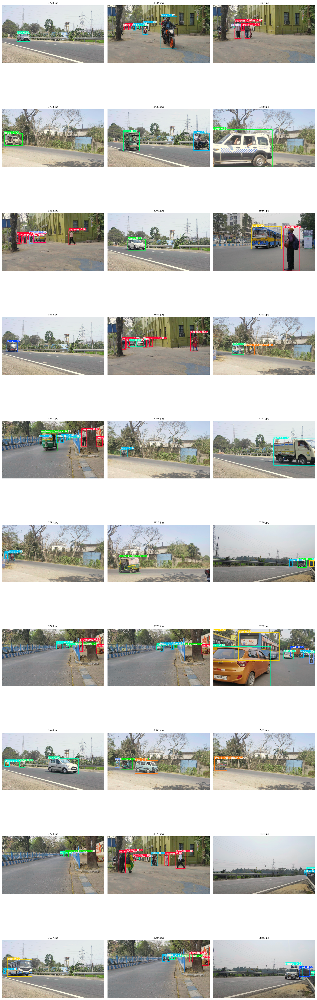

In [11]:
import os
import random
import cv2
import numpy as np
import torch
from IPython.display import display
import matplotlib.pyplot as plt
from pathlib import Path
#from yolov6 import detect  # Import detect.py as a module

def display_random_images_from_folder(folder_path, num_images=30):
    """
    Finds and displays a random selection of .jpg, .png, and .jpeg images from a specified folder.
    """
    # Supported image extensions
    valid_extensions = ('.jpg', '.jpeg', '.png')
    
    # List all valid images
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]

    if not image_files:
        print("No valid images found in the specified folder.")
        return

    # Randomly select images (up to num_images)
    num_images = min(num_images, len(image_files))  # In case there are fewer than 30 images
    selected_images = random.sample(image_files, num_images)

    # Grid setup
    grid_rows = 10  # Adjust based on num_images
    grid_cols = 3
    plt.figure(figsize=(15, 5*grid_rows))  # Adjust figure size

    for i, image_file in enumerate(selected_images):
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_XYZ2RGB)
        
        plt.subplot(grid_rows, grid_cols, i + 1)
        plt.imshow(image_rgb)
        plt.title(image_file, fontsize=8)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage
display_random_images_from_folder("/kaggle/working/inference_results/images")